In [5]:
#Cantharellus Vision

import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [6]:
import pathlib
data_dir = 'dataset'
data_dir = pathlib.Path(data_dir).with_suffix("")

In [7]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

727


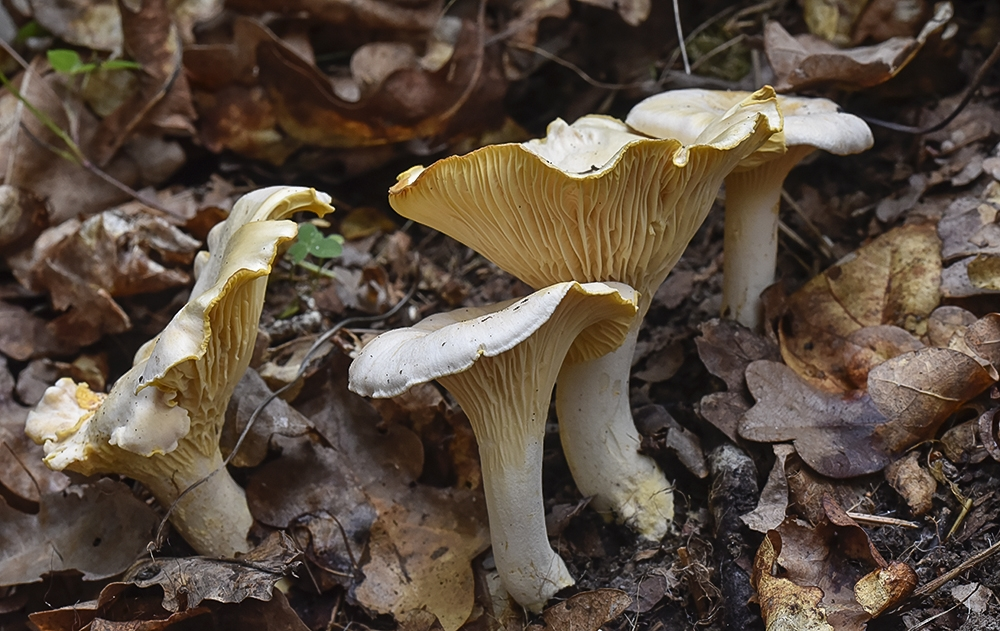

In [8]:
import PIL
kantareller = list(data_dir.glob('*Cantharellus pallens/*.jpg'))
PIL.Image.open(str(kantareller[0]))

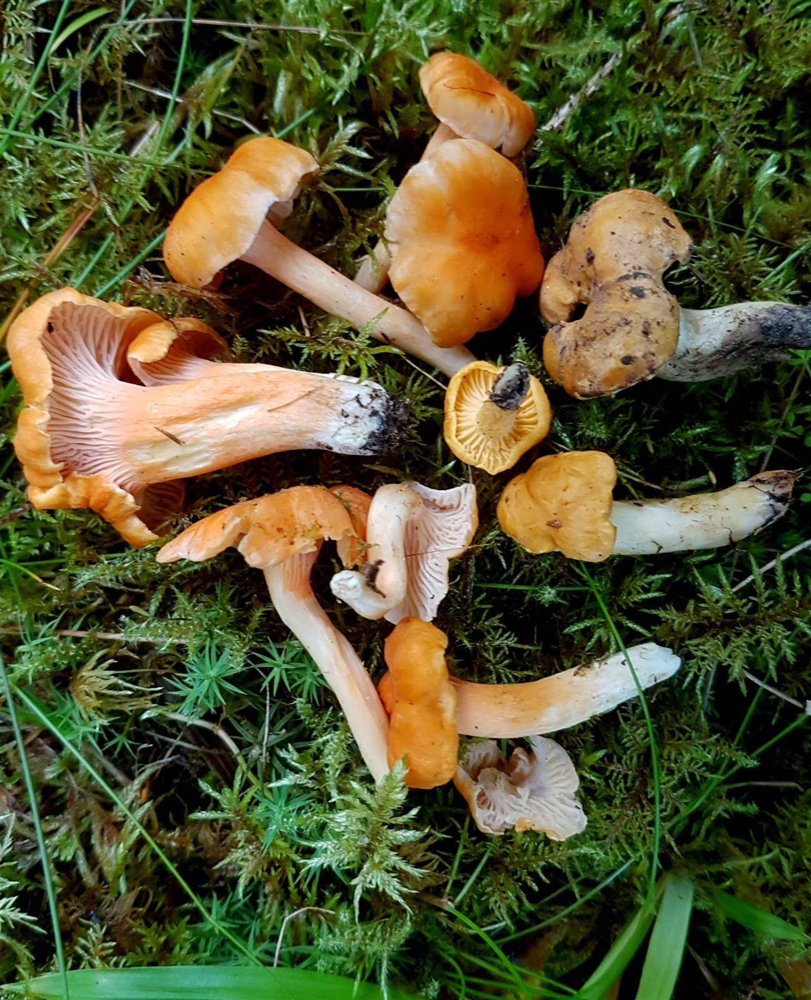

In [9]:
import PIL
kantareller = list(data_dir.glob('*Cantharellus friesii/*.jpg'))
PIL.Image.open(str(kantareller[0]))

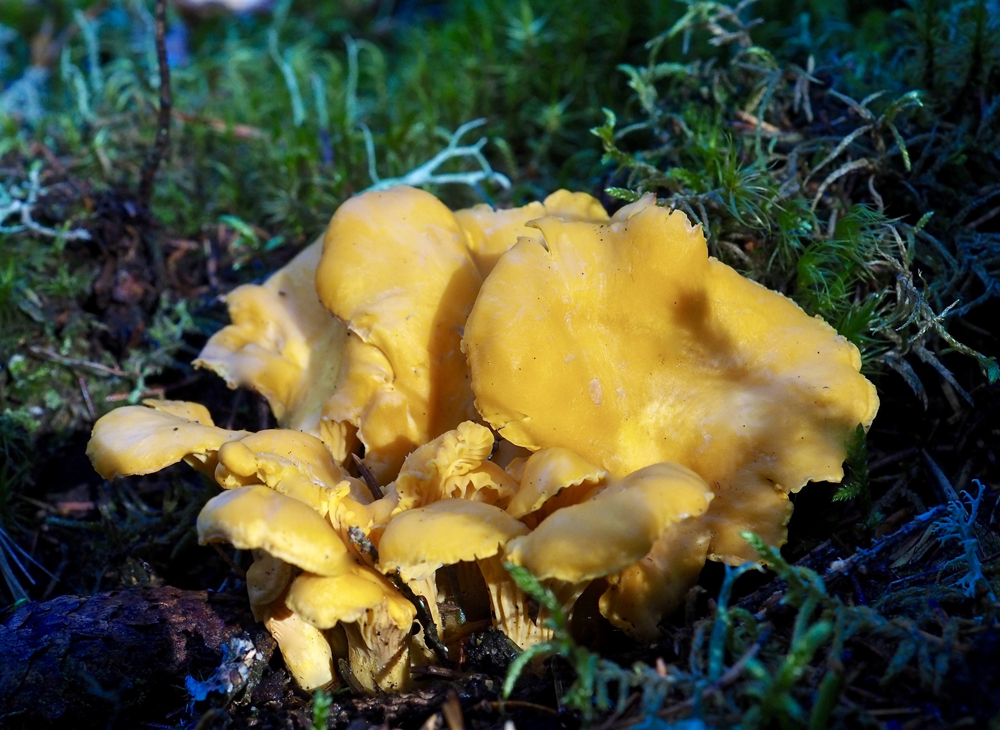

In [10]:
import PIL
kantareller = list(data_dir.glob('*Cantharellus cibarius/*.jpg'))
PIL.Image.open(str(kantareller[0]))

In [11]:
BATCH_SIZE = 32
IMG_SIZE = (160, 160)

In [12]:
train_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE)

Found 727 files belonging to 3 classes.
Using 582 files for training.


In [13]:
val_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE)

Found 727 files belonging to 3 classes.
Using 145 files for validation.


In [14]:
class_names = train_dataset.class_names
print(class_names)

['Cantharellus cibarius', 'Cantharellus friesii', 'Cantharellus pallens']


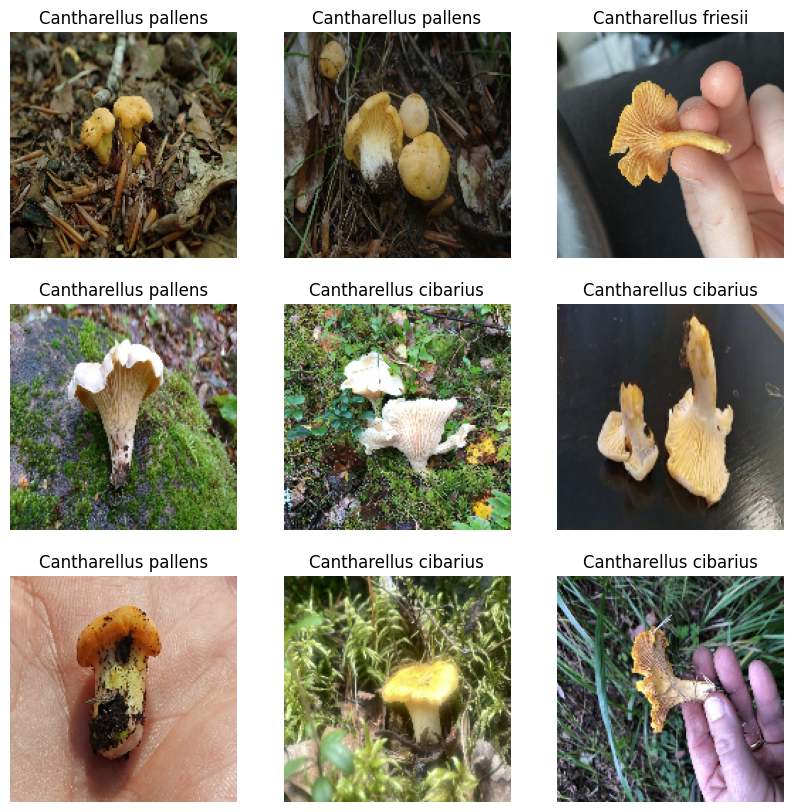

In [36]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [37]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.cache().prefetch(buffer_size=AUTOTUNE)

In [38]:
normalization_layer = tf.keras.layers.Rescaling(1./255)

In [39]:
normalized_ds = train_dataset.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [40]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

num_classes = len(class_names)

model = Sequential([
    layers.Rescaling(1./255, input_shape=(160,160,3)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

In [41]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])

In [42]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 80, 80, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 40, 40, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 40, 40, 64)        1

In [43]:
epochs=10
history = model.fit(
  train_dataset,
  validation_data=val_dataset,
  epochs=epochs
)

Epoch 1/10
19/19 [==============================] - 6s 251ms/step - loss: 0.9173 - accuracy: 0.6924 - val_loss: 0.5803 - val_accuracy: 0.8000
Epoch 2/10
19/19 [==============================] - 4s 224ms/step - loss: 0.6490 - accuracy: 0.7440 - val_loss: 0.5522 - val_accuracy: 0.8000
Epoch 3/10
19/19 [==============================] - 4s 211ms/step - loss: 0.5968 - accuracy: 0.7509 - val_loss: 0.5206 - val_accuracy: 0.8207
Epoch 4/10
19/19 [==============================] - 4s 217ms/step - loss: 0.5663 - accuracy: 0.7784 - val_loss: 0.5062 - val_accuracy: 0.8138
Epoch 5/10
19/19 [==============================] - 4s 212ms/step - loss: 0.5153 - accuracy: 0.8041 - val_loss: 0.5181 - val_accuracy: 0.8138
Epoch 6/10
19/19 [==============================] - 4s 208ms/step - loss: 0.4610 - accuracy: 0.8230 - val_loss: 0.4631 - val_accuracy: 0.8276
Epoch 7/10
19/19 [==============================] - 4s 207ms/step - loss: 0.4111 - accuracy: 0.8316 - val_loss: 0.4687 - val_accuracy: 0.8207
Epoch 

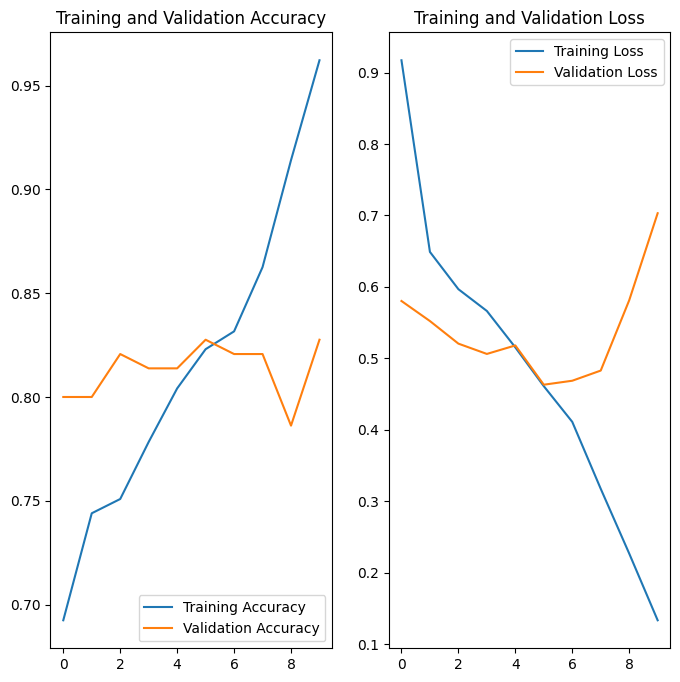

In [44]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()